<a href="https://colab.research.google.com/github/fcolombo7/AN2DL-2020/blob/main/U_Net_aug.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Segmentation using a **U-Net** like neural network

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
import os
from zipfile import ZipFile
import sys
sys.path.append('/content/drive/MyDrive/ANN_project2/starting_kit')

from prepare_submission import *
from read_mask_example import * 
from decode_rle_example import *

import tensorflow as tf
import numpy as np
from datetime import datetime

import cv2
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
# Set the seed for random operations. 
SEED = 1234
tf.random.set_seed(SEED)

In [4]:
#Definitions of constants
drive_root_folder = '/content/drive/MyDrive/ANN_project2/'
apply_data_augmentation = True
IMG_W, IMG_H = 2048, 1536
batch_size = 1

## Load the dataset

In [5]:
if not os.path.exists('Development_Dataset'):
  with ZipFile('./drive/MyDrive/ANN_project2/dataset.zip', 'r') as zipObj:
    # Extract all the contents of zip file in current directory
    zipObj.extractall()
print('The dataset is loaded.')

The dataset is loaded.


In [6]:
cwd = os.getcwd()

Define the `ImageDataGenerator`

In [7]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

if apply_data_augmentation:
    img_data_gen = ImageDataGenerator(rotation_range=10,
                                      width_shift_range=10,
                                      height_shift_range=10,
                                      zoom_range=0.3,
                                      horizontal_flip=True,
                                      vertical_flip=True,
                                      fill_mode='reflect')
    mask_data_gen = ImageDataGenerator(rotation_range=10,
                                       width_shift_range=10,
                                       height_shift_range=10,
                                       zoom_range=0.3,
                                       horizontal_flip=True,
                                       vertical_flip=True,
                                       fill_mode='reflect')

In [67]:
from google.colab.patches import cv2_imshow
def augment_dihedral(path_to_type, consider_list = None):
  list_images = []
  for image in os.listdir(os.path.join(path_to_type, 'Images')):
    #if (any(image.strip('.png') in i for i in consider_list)):
      img_pth = os.path.join(path_to_type, 'Images', image)
      mask_pth = os.path.join(path_to_type, 'Masks', image.strip('.jpg') + ('.png'))
      img = cv2.imread(img_pth)
      mask = cv2.imread(mask_pth)

      #rotation
      img_rotate_180 = cv2.rotate(img, cv2.ROTATE_180)
      #cv2_imshow(img_rotate_180)
      cv2.imwrite(img_pth.strip('.jpg') + '_180.jpg', img_rotate_180)
      mask_rotate_180 = cv2.rotate(mask, cv2.ROTATE_180)
      #cv2_imshow(mask_rotate_180)
      cv2.imwrite(mask_pth.strip('.png') + '_180.png', mask_rotate_180)

      list_images.append((path_to_type, img_pth.split('/')[-1].strip('.jpg') + '_180'))

      #rotation and flip
      img_flip = cv2.flip(img, 1)
      mask_flip = cv2.flip(mask, 1)

      img_flip_rotate_180 = cv2.rotate(img_flip, cv2.ROTATE_180)
      cv2.imwrite(img_pth.strip('.jpg') + '_180_flip.jpg', img_flip_rotate_180)
      mask_flip_rotate_180 = cv2.rotate(mask_flip, cv2.ROTATE_180)
      cv2.imwrite(mask_pth.strip('.png') + '_180_flip.png', mask_flip_rotate_180)

      list_images.append((path_to_type, img_pth.split('/')[-1].strip('.jpg') + '_180_flip'))

  return list_images

In [68]:
from PIL import Image
from sklearn.model_selection import train_test_split

class CustomDataset(tf.keras.utils.Sequence):

  """
    CustomDataset inheriting from tf.keras.utils.Sequence.

    3 main methods:
      - __init__: save dataset params like directory, filenames..
      - __len__: return the total number of samples in the dataset
      - __getitem__: return a sample from the dataset

    Note: 
      - the custom dataset return a single sample from the dataset. Then, we use 
        a tf.data.Dataset object to group samples into batches.
      - in this case we have a different structure of the dataset in memory. 
        We have all the images in the same folder and the training and validation splits
        are defined in text files.

  """

  def __init__(self, dataset_dir_list, which_subset, seed=1234, valid_perc=0.2, img_generator=None, mask_generator=None, 
               preprocessing_function=None, out_shape=[256, 256]):
    
    self.subset_filenames=[]
    for dataset_dir in dataset_dir_list:
      #get all the filenames
      path = dataset_dir
      #single filename list
      l = os.listdir(os.path.join(path, 'Images'))
      l = list(map(lambda x: x[:-4], l))
      #print(l)
      #get the train test split
      pos_train, pos_valid = train_test_split(range(len(l)), test_size = valid_perc, random_state=seed)
      sel_pos= pos_train if which_subset == 'training' else pos_valid
      for pos in sel_pos:
        self.subset_filenames.append((dataset_dir, l[pos]))

    consider_list = self.subset_filenames.copy()
    for dataset_dir in dataset_dir_list:
      self.subset_filenames.extend(augment_dihedral(dataset_dir, consider_list = consider_list))
    
    self.which_subset = which_subset
    self.dataset_dir_list = dataset_dir_list
    self.img_generator = img_generator
    self.mask_generator = mask_generator
    self.preprocessing_function = preprocessing_function
    self.out_shape = out_shape

  def __len__(self):
    return len(self.subset_filenames)

  def __getitem__(self, index):
    # Read Image
    curr_filename = self.subset_filenames[index]
    img = Image.open(os.path.join(curr_filename[0], 'Images', curr_filename[1] + '.jpg'))
    #mask = Image.open(os.path.join(curr_filename[0], 'Masks', curr_filename[1] + '.png'))
    

    # Resize image and mask
    img = img.resize(self.out_shape)
    #mask = mask.resize(self.out_shape, resample=Image.NEAREST)
    mask_arr = read_rgb_mask(os.path.join(curr_filename[0], 'Masks', curr_filename[1] + '.png'), out_shape=self.out_shape)
    
    img_arr = np.array(img)
    #mask_arr = np.array(mask)

    # in this dataset 255 mask label is assigned to an additional class, which corresponds 
    # to the contours of the objects. We remove it for simplicity.
    #mask_arr[mask_arr == 255] = 0  

    mask_arr = np.expand_dims(mask_arr, -1)

    if self.which_subset == 'training':
      if self.img_generator is not None and self.mask_generator is not None:
        # Perform data augmentation
        # We can get a random transformation from the ImageDataGenerator using get_random_transform
        # and we can apply it to the image using apply_transform
        img_t = self.img_generator.get_random_transform(img_arr.shape, seed=SEED)
        mask_t = self.mask_generator.get_random_transform(mask_arr.shape, seed=SEED)
        img_arr = self.img_generator.apply_transform(img_arr, img_t)
        # ImageDataGenerator use bilinear interpolation for augmenting the images.
        # Thus, when applied to the masks it will output 'interpolated classes', which
        # is an unwanted behaviour. As a trick, we can transform each class mask 
        # separately and then we can cast to integer values (as in the binary segmentation notebook).
        # Finally, we merge the augmented binary masks to obtain the final segmentation mask.
        out_mask = np.zeros_like(mask_arr)
        for c in np.unique(mask_arr):
          if c > 0:
            curr_class_arr = np.float32(mask_arr == c)
            curr_class_arr = self.mask_generator.apply_transform(curr_class_arr, mask_t)
            # from [0, 1] to {0, 1}
            curr_class_arr = np.uint8(curr_class_arr)
            # recover original class
            curr_class_arr = curr_class_arr * c 
            out_mask += curr_class_arr
    else:
      out_mask = mask_arr
    
    if self.preprocessing_function is not None:
        img_arr = self.preprocessing_function(img_arr)

    return img_arr, np.float32(out_mask)

In [69]:
from tensorflow.keras.applications.vgg16 import preprocess_input 
dir1 = os.path.join(cwd, 'Development_Dataset', 'Training', 'Bipbip', 'Haricot')
dir2 = os.path.join(cwd, 'Development_Dataset', 'Training', 'Bipbip', 'Mais')


dataset = CustomDataset([dir1, dir2], 
                        'training',
                        seed = SEED,
                        valid_perc=0.2,
                        img_generator=img_data_gen,
                        mask_generator=mask_data_gen,
                        out_shape=[IMG_W, IMG_H],
                        preprocessing_function=None)

dataset_valid = CustomDataset([dir1, dir2], 
                        'validation',
                        seed = SEED,
                        valid_perc=0.2,
                        img_generator=img_data_gen,
                        mask_generator=mask_data_gen,
                        out_shape=[IMG_W, IMG_H],
                        preprocessing_function=None)

error: ignored

In [44]:
train_dataset = tf.data.Dataset.from_generator(lambda: dataset,
                                               output_types=(tf.float32, tf.float32),
                                               output_shapes=([IMG_H, IMG_W, 3], [IMG_H, IMG_W, 1]))

train_dataset = train_dataset.batch(batch_size=batch_size)
train_dataset = train_dataset.repeat()

valid_dataset = tf.data.Dataset.from_generator(lambda: dataset_valid,
                                               output_types=(tf.float32, tf.float32),
                                               output_shapes=([IMG_H, IMG_W, 3], [IMG_H, IMG_W, 1]))

valid_dataset = valid_dataset.batch(batch_size=batch_size)
valid_dataset = valid_dataset.repeat()

### Visualization of some samples
Test the setup and check if the generator works as expected.

Define some helper functions that will be used to explore input images and prediction results.

In [45]:
def mask_to_img(mask):
  colors = {
      'background': [0, 0, 0],
      'crop': [255, 255, 255],
      'weed': [216, 67, 82]
  }
  mask = np.squeeze(mask, axis=2)
  mask_img = np.zeros([mask.shape[0], mask.shape[1], 3])
  mask_img[np.where(mask == 0)] = colors['background']
  mask_img[np.where(mask == 1)] = colors['crop']
  mask_img[np.where(mask == 2)] = colors['weed']
  return mask_img

def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

def display(display_list, is_exploration=False, figsize = (15,15)):
  plt.figure(figsize=figsize)

  title = ['Input Image', 'True Mask' , 'Predicted Mask']
  if is_exploration:
    title = title[:-1]
  elif len(display_list) == 2:
    title = title[[0,2]]

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    if i == 0:
      img = display_list[i]
    else:
      img = mask_to_img(display_list[i])
    plt.imshow(tf.keras.preprocessing.image.array_to_img(img))
    plt.axis('off')  

  plt.show()

def show(model=None, dataset=None, num=1, image_path=None, figsize = (15,15)):
  if dataset:
    for image, mask in dataset.take(num):
      if model:
        pred_mask = model.predict(image)
        image= np.squeeze(image,axis=0)
        mask = np.squeeze(mask, axis=0)
        display([image,
                 mask,
                 create_mask(pred_mask)], is_exploration = False, figsize = figsize)
      else:
        image= np.squeeze(image,axis=0)
        mask = np.squeeze(mask, axis=0)
        display([image, mask], is_exploration = True, figsize = figsize)
  else:
    img = Image.open(image_path)
    img_arr = np.array(img)
    display([img_arr,
             create_mask(model.predict(x=tf.expand_dims(img_arr, 0)))], is_exploration = False, figsize = figsize)

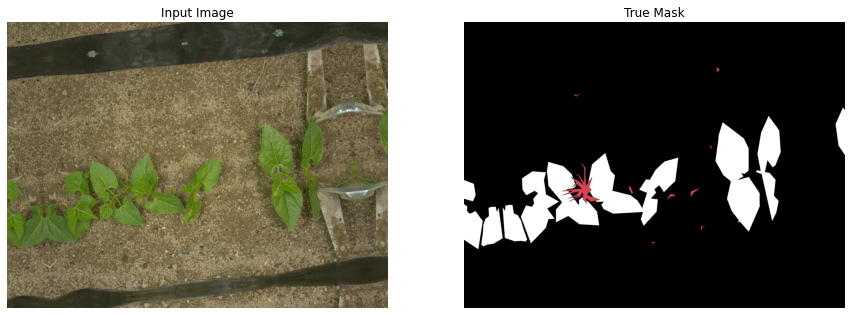

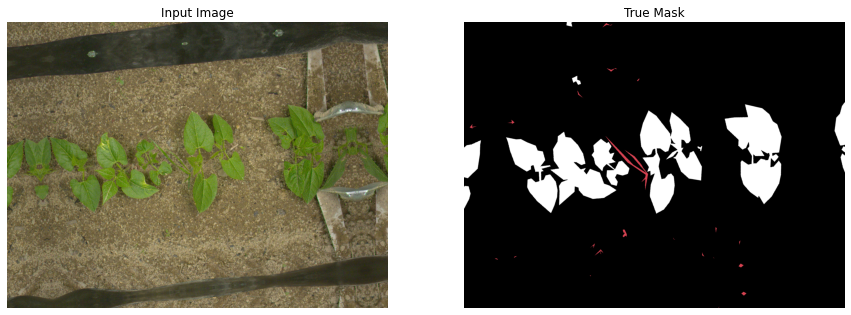

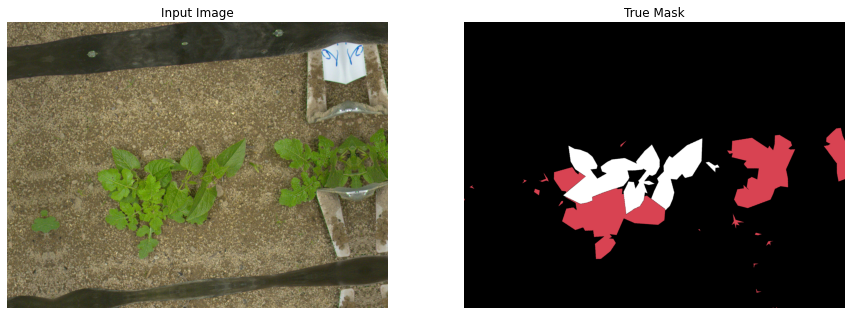

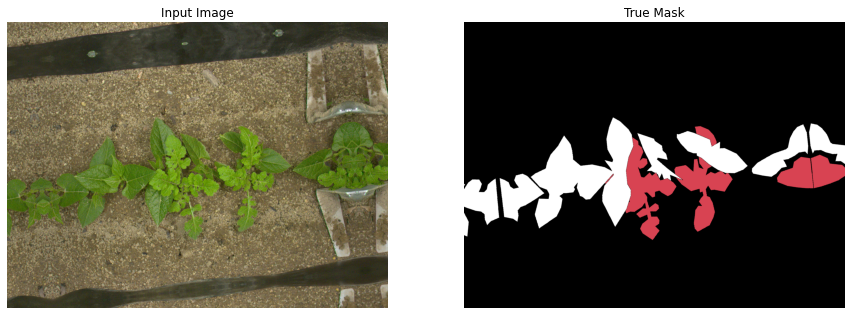

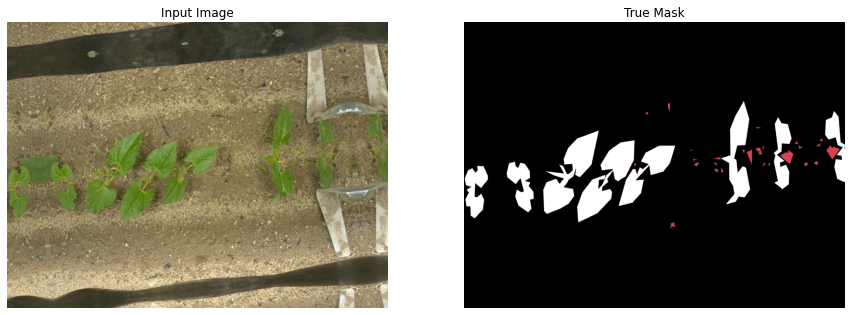

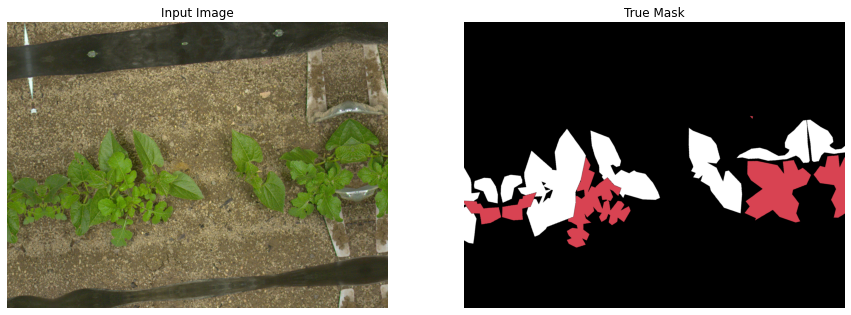

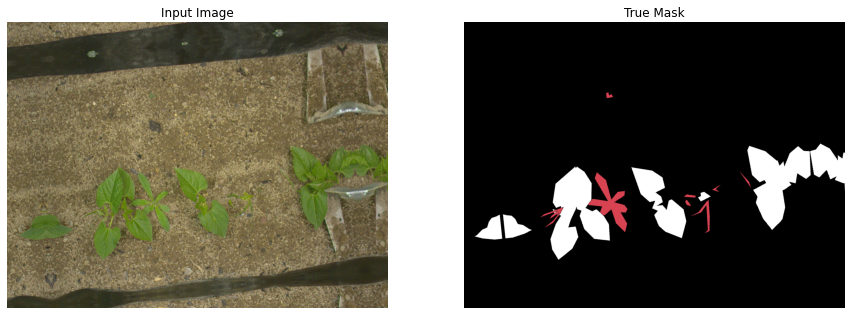

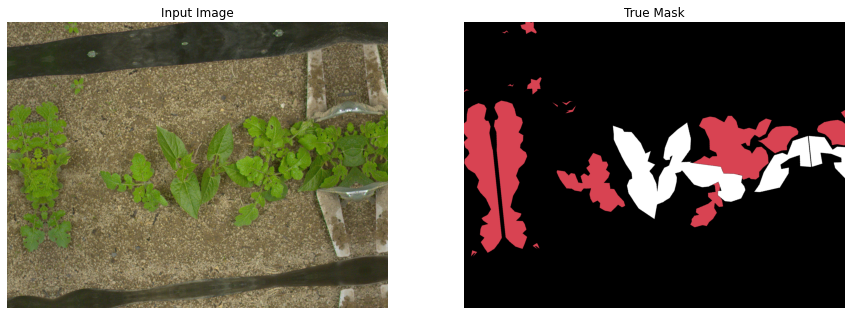

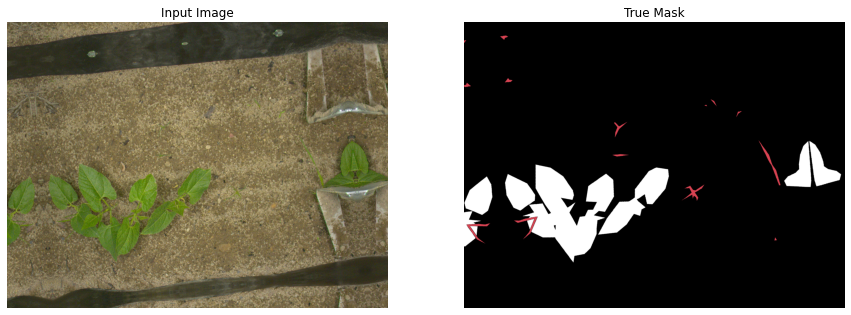

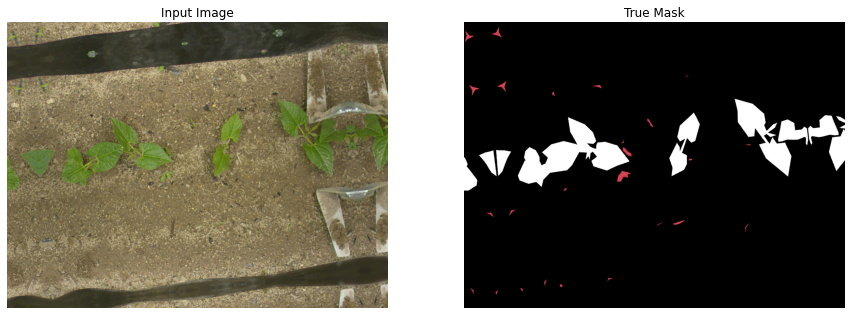

In [48]:
show(dataset=train_dataset, num = 10)

## CNN design

Taking inspiration from [this implementation](https://www.kaggle.com/krishanudb/keras-based-unet-model-construction-tutorial/data).
Here the definition of some helper function used to build the *U-Net like* network.

In [ ]:
from keras.layers import Conv2DTranspose
from keras.layers import Conv2D
from keras.layers import BatchNormalization
from keras.layers import Activation
from keras.layers import Concatenate
from keras.layers import Input
from keras.layers import MaxPooling2D

Downsampling block:

In [ ]:
def DownsamplingBlock(x, #input layer
                 level, #depth level
                 filters, #filter_size i.e. depth of the conv layer
                 kernel_size = (3, 3),
                 num_convs = 2,
                 conv_strides = (1, 1),
                 activation = 'relu',
                 batch_norm = False, #non ho idea di cosa faccia
                 pool_size = (2, 2),
                 pool_strides = (2, 2),
                 regularizer = None,
                 regularizer_param = 0.001):
  
    if regularizer is not None:
        if regularizer == 'l2':
            reg = regularizers.l2(regularizer_param)
        elif regularizer == 'l1':
            reg = regularizers.l1(regularizer_param)
    else:
        reg = None

    for i in range(num_convs):
        x = Conv2D(filters=filters,
                   kernel_size=kernel_size, 
                   strides=conv_strides, 
                   padding='same', 
                   kernel_regularizer=reg, 
                   bias_regularizer=reg, 
                   name = 'downsampling_' + str(level) + '_conv_' + str(i))(x)
        if batch_norm:
            x = BatchNormalization(name = 'downsampling_' + str(level) + '_batchnorm_' + str(i))(x)
        x = Activation(activation, name = 'downsampling_' + str(level) + '_activation_' + str(i))(x)
    skip = x
    x = MaxPooling2D(pool_size=pool_size, strides=pool_strides)(x)
    return x, skip

Upsampling block:

In [ ]:
def UpsamplingBlock(x, # input layer
               level, # level of the net
               skip, # skip connection for concatenation
               filters, # depth of the convolutional layer
               kernel_size = (3, 3),
               num_convs = 2,
               conv_strides = (1,1),
               activation = 'relu',
               batch_norm = False,
               conv_transpose = True,
               upsampling_size = (2,2) ,
               upsampling_strides = (2,2),
               regularizer = None,
               regularizer_param = 0.001):
  
    if regularizer is not None:
        if regularizer == 'l2':
            reg = regularizers.l2(regularizer_param)
        elif regularizer == 'l1':
            reg = regularizers.l1(regularizer_param)
    else:
        reg = None
    
    x = Conv2DTranspose(filters=filters, 
                        kernel_size=upsampling_size, 
                        strides=upsampling_strides, 
                        name = 'upsampling_' + str(level) + '_conv_trans_' + str(level))(x)
    x = Concatenate()([x, skip])
    for i in range(num_convs):
        x = Conv2D(filters=filters, 
                   kernel_size=kernel_size, 
                   strides=(1, 1),
                   padding='same',
                   kernel_regularizer=reg,
                   bias_regularizer=reg,
                   name = 'upsampling_' + str(level) + '_conv_' + str(i))(x)
        if batch_norm:
            x = BatchNormalization(name = 'upsampling_' + str(level) + '_batchnorm_' + str(i))(x)
        x = Activation(activation, name = 'upsampling_' + str(level) + '_activation_' + str(i))(x)
    return x


Bottleneck (connectior between Encoder and Decoder):

In [ ]:
# there is another version called bootleneck dilatated.. we start with the simpler one    
def BottleneckBlock(x,
               filters,
               kernel_size = (3, 3),
               num_convs = 2,
               conv_strides= (1,1),
               activation = 'relu',
               batch_norm = False,
               #pool_size = (2, 2),
               #pool_strides = (1,1),
               regularizer = None, 
               regularizer_param = 0.001):
    if regularizer is not None:
        if regularizer == 'l2':
            reg = regularizers.l2(regularizer_param)
        elif regularizer == 'l1':
            reg = regularizers.l1(regularizer_param)
    else:
        reg = None
    for i in range(num_convs):
        x = Conv2D(filters=filters,
                   kernel_size=kernel_size,
                   strides= conv_strides,
                   padding='same',
                   kernel_regularizer=reg, 
                   bias_regularizer=reg,
                   name = 'bottleneck_' + str(i))(x)
        if batch_norm:
            x = BatchNormalization()(x)
        x = Activation(activation)(x)
    return x

Last, the model builder:

In [ ]:
def get_unet(num_classes,
             num_levels,
             input_shape,
             num_conv_layers_per_block = 2,
             num_bottleneck = 2, #number of convolutional layer in between encoder and decoder
             filter_depth_start = 16,
             batch_norm = False,
             kernel_size = (3, 3),
             regularizer = None,
             regularizer_param = 0.001):
  
    inputs = Input((input_shape))
    x = inputs
    skips = []
    for i in range(num_levels):
        x, skip = DownsamplingBlock(x, i,
                               filter_depth_start * (2 ** i), 
                               kernel_size, 
                               num_conv_layers_per_block,
                               batch_norm = batch_norm,
                               regularizer= regularizer,
                               regularizer_param=regularizer_param)
        skips.append(skip)

    x = BottleneckBlock(x,
                   filter_depth_start * (2 ** num_levels),
                   kernel_size,
                   num_bottleneck,
                   batch_norm=batch_norm,
                   regularizer=regularizer, 
                   regularizer_param=regularizer_param)
    
    for j in range(num_levels):
        x = UpsamplingBlock(x, j,
                            skips[num_levels - j - 1],
                            filter_depth_start * (2 ** (num_levels - j - 1)),
                            kernel_size,
                            num_conv_layers_per_block,
                            batch_norm=batch_norm, 
                            regularizer= regularizer,
                            regularizer_param=regularizer_param)
        
    outputs = Conv2D(filters=num_classes,
                     kernel_size=(1,1), 
                     strides=(1,1), 
                     padding='same', 
                     activation='softmax', 
                     name = 'output_softmax')(x)
    
    model = tf.keras.Model(inputs = inputs, outputs = outputs)
    return model



Build the **U-Net** model and print its summary:

In [ ]:
model = get_unet(3, 4, (IMG_H, IMG_W, 3), filter_depth_start=32)
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 1536, 2048,  0                                            
__________________________________________________________________________________________________
downsampling_0_conv_0 (Conv2D)  (None, 1536, 2048, 3 896         input_1[0][0]                    
__________________________________________________________________________________________________
downsampling_0_activation_0 (Ac (None, 1536, 2048, 3 0           downsampling_0_conv_0[0][0]      
__________________________________________________________________________________________________
downsampling_0_conv_1 (Conv2D)  (None, 1536, 2048, 3 9248        downsampling_0_activation_0[0][0]
_______________________________________________________________________________________

## Train the model

Definition of the metric:

In [ ]:
def meanIoU(y_true, y_pred):
    # get predicted class from softmax
    y_pred = tf.expand_dims(tf.argmax(y_pred, -1), -1)

    per_class_iou = []
    for i in range(1,3): # exclude the background class 0
      # Get prediction and target related to only a single class (i)
      class_pred = tf.cast(tf.where(y_pred == i, 1, 0), tf.float32)
      class_true = tf.cast(tf.where(y_true == i, 1, 0), tf.float32)
      intersection = tf.reduce_sum(class_true * class_pred)
      union = tf.reduce_sum(class_true) + tf.reduce_sum(class_pred) - intersection
    
      iou = (intersection + 1e-7) / (union + 1e-7)
      per_class_iou.append(iou)

    return tf.reduce_mean(per_class_iou)

Compile the model:

In [ ]:
# Loss
loss = tf.keras.losses.SparseCategoricalCrossentropy() 
# learning rate
lr = 1e-3
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

metrics = ['accuracy', meanIoU]

# Compile Model
model.compile(optimizer=optimizer, loss=loss, metrics=metrics)

Visualization in `TensorBoar`

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/My\ Drive/ANN_project2/segmentation_results/

<IPython.core.display.Javascript object>

Definition of the callbacks and training.

In [ ]:
TRAIN_NOW = False

In [ ]:
def get_callbacks(name, es=True, LR = False , patience = 10):
  obj = []

  exps_dir = os.path.join(drive_root_folder,'segmentation_results')
  if not os.path.exists(exps_dir):
    os.mkdir(exps_dir)

  #now = datetime.now().strftime('%b%d_%H-%M-%S')
  temp_dir = name

  #Model Checkpoints
  ckpt_dir = os.path.join(exps_dir, temp_dir, 'ckpts')
  if not os.path.exists(ckpt_dir):
    os.makedirs(ckpt_dir)

  obj.append(tf.keras.callbacks.ModelCheckpoint(filepath = os.path.join(ckpt_dir, 'cp.ckpt'),
                                                save_weights_only = True,
                                                save_best_only = True))
  
  #Tensor board logs
  tb_dir = os.path.join(exps_dir, temp_dir + '/tb_logs')
  if not os.path.exists(tb_dir):
    os.makedirs(tb_dir)
  obj.append(tf.keras.callbacks.TensorBoard(log_dir=tb_dir,
                                            profile_batch = 0,
                                            histogram_freq = 1))
  if es:
    obj.append(tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', patience = patience))

  if LR:
    obj.append(tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=3,
    mode="auto",
    min_lr=0.0001
    ))

  return obj

In [ ]:
name = 'U-Net_s32'
if TRAIN_NOW:
  model.fit(x = train_dataset,
            epochs = 100,  #### set repeat in training dataset
            steps_per_epoch = len(dataset),
            validation_data = valid_dataset,
            validation_steps = len(dataset_valid), 
            callbacks = get_callbacks(name, es=True, patience=15))
else:
  print('Train skipped.')

Train skipped.


Load the best model according to the checkpoint.

In [ ]:
LOAD_NOW = True

In [ ]:
model_to_load = name
if LOAD_NOW:
  ckpt_path = os.path.join(drive_root_folder, 'segmentation_results', model_to_load, 'ckpts','cp.ckpt')
  model.load_weights(ckpt_path)
  print('Model loaded.')
else:
  print('Model load skipped.')

Model loaded.


# Prediction
Here the model is tested performing prediction on images not used for training (images coming from the validation set) and there is a comparison between the *true* and *predicted* mask.

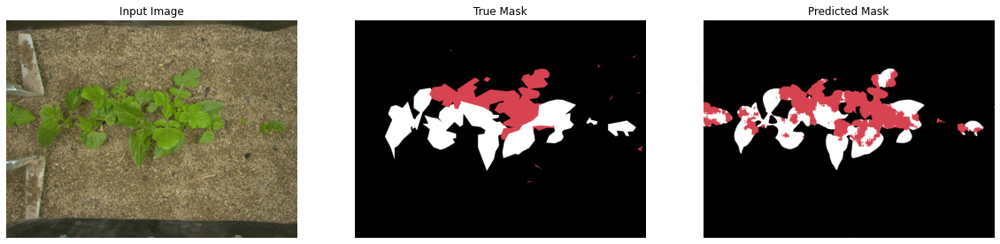

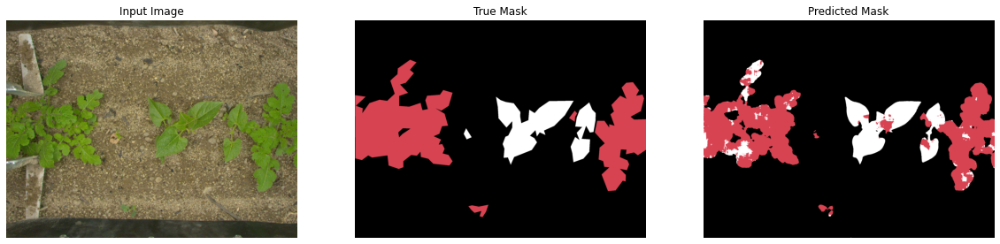

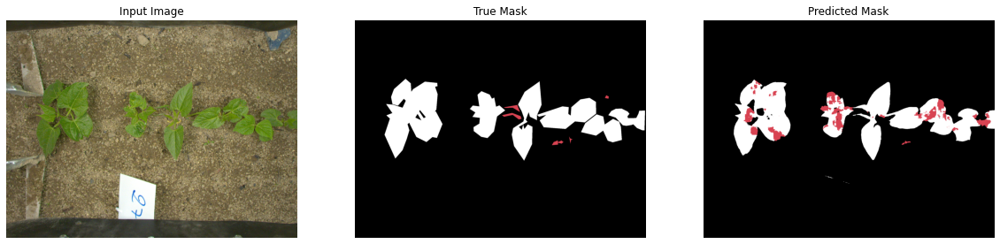

In [ ]:
show(model, dataset=valid_dataset, num=3, figsize=(20,15))

# Submission

In [ ]:
import os
import json
import numpy as np
from PIL import Image

def rle_encode(img):
    '''
    img: numpy array, 1 - foreground, 0 - background
    Returns run length as string formatted
    '''
    pixels = img.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

In [ ]:
def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

def create_json(model):
  team_list = ['Bipbip', 'Pead', 'Roseau', 'Weedelec']
  crop_list = ['Haricot', 'Mais']

  root_path = 'Development_Dataset/Test_Dev/'
  submission_dict = {}
  for team in team_list:
    for crop in crop_list:
      l = os.listdir(os.path.join(root_path, team, crop, 'Images'))  
      l = list(map(lambda x: x[:-4], l))

      for img_name in l:
        img = None
        try:
          img = Image.open(os.path.join(root_path, team, crop, 'Images', img_name+'.jpg'))
        except:
          img = Image.open(os.path.join(root_path, team, crop, 'Images', img_name+'.png'))
        original_shape = np.array(img).shape
        img = img.resize((IMG_W, IMG_H));
        img_arr = np.array(img)
        mask_arr = create_mask(model.predict(x=tf.expand_dims(img_arr, 0))).numpy()
        #mask_img = mask_to_img(mask_arr)

        submission_dict[img_name] = {}
        submission_dict[img_name]['shape'] = [original_shape[0], original_shape[1]]
        submission_dict[img_name]['team'] = team
        submission_dict[img_name]['crop'] = crop
        submission_dict[img_name]['segmentation'] = {}

        # RLE encoding
        # crop
        rle_encoded_crop = rle_encode(mask_arr == 1)
        # weed
        rle_encoded_weed = rle_encode(mask_arr == 2)

        submission_dict[img_name]['segmentation']['crop'] = rle_encoded_crop
        submission_dict[img_name]['segmentation']['weed'] = rle_encoded_weed

  # Finally, save the results into the submission.json file

  now = datetime.now().strftime('%b%d_%H-%M-%S')
  out_path = drive_root_folder + 'submission_'+ now +'.json'
  with open(out_path, 'w') as f:
    json.dump(submission_dict, f)
  print(f'{out_path} created.')
  return submission_dict

In [ ]:
sub = create_json(model)

/content/drive/MyDrive/ANN_project2/submission_Dec16_11-04-07.json created.
